#Installing packages

In [ ]:
!pip install wordcloud-fa

#Importing Libraries

In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np
import math
import matplotlib.pyplot as plt
from wordcloud_fa import WordCloudFa
from collections import Counter

# Data Loading

In [ ]:
data = pd.read_csv('Data_Analyst_Assigment.csv')
data

,Unnamed: 0,search_input,timestamp,attempt_id,user_location,selected_place_index,selected_place_location,pin_location,metric_ap,metric_rr
0,0,بلوارایت اله ایزدی,2023-05-20 03:50:50,5fb445c4-760e-4956-a9be-d429de6c5c75,"32.4251125,51.3261579",0.0,"32.6306106,51.4016186",NaN,0.000000,0.000000
1,1,کلینیک چشم پزشکی نگاه,2023-05-20 09:39:07,b975bfef-de5f-430d-9230-5bb71a36e0b3,NaN,NaN,NaN,NaN,NaN,NaN
2,2,سازمان راهداری و حمل و نقل جاده ای,2023-05-20 05:42:01,15de915c-e26d-42a2-a076-b1006cd536fd,"35.746677000000005,51.42000200000001",0.0,NaN,"35.709445999999964,51.405190000000005",1.000000,1.000000
3,3,تهران مترو خيام,2023-05-20 12:01:37,57e82b9d-94f0-4e0f-a9d1-aa60c1f51e52,"35.82748676814743,50.97467422485352",2.0,NaN,"35.67380742811089,51.41375720500947",0.416667,0.333333
4,4,کرج میدان,2023-05-20 18:02:16,ec2586f3-ce0f-424a-98c2-82c583b097ca,"35.8113711,51.0059891",0.0,"35.8122984,51.0074763",NaN,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...
19995,1995,NaN,NaN,420d8fbf-a953-4a9c-ab58-e298e930e863,NaN,NaN,NaN,NaN,NaN,NaN
19996,1996,NaN,NaN,d3c226f9-3d38-4ed6-8834-b6331e4ba8a8,"37.274473,49.55868399999997",0.0,NaN,"37.25796900000001,49.57179400000001",1.000000,1.000000
19997,1997,NaN,NaN,7b5d9c1d-c478-4670-a2be-a959aada0c1b,"35.645784898990414,51.325687598617776",1.0,NaN,"35.77019937471258,51.30129235413338",0.500000,0.500000
19998,1998,NaN,NaN,b4ae0490-9db0-4faf-9838-dde90ce42484,"35.75644523765672,51.328334071417686",1.0,NaN,"35.79111399999999,51.35799299999999",0.500000,0.500000


#data types visualzation

In [ ]:
data.dtypes

Unnamed: 0                   int64
search_input                object
timestamp                   object
attempt_id                  object
user_location               object
selected_place_index       float64
selected_place_location     object
pin_location                object
metric_ap                  float64
metric_rr                  float64
dtype: object

# Count number of null values in each column

In [ ]:
data.isna().sum()

Unnamed: 0                     0
search_input               18000
timestamp                  18000
attempt_id                     0
user_location               3215
selected_place_index        3201
selected_place_location    15646
pin_location                7724
metric_ap                   3201
metric_rr                   3201
dtype: int64

#Handling Null Values

In [ ]:
# data['search_input'].fillna('Unknown', inplace = True)
data['selected_place_index'].fillna(-1, inplace = True)
data['metric_ap'].fillna(-1, inplace = True)
data['metric_rr'].fillna(-1, inplace = True)
data['pin_location'].fillna("Undefined", inplace = True)

#Add Search Type (search definition) column

In [ ]:
def search_result(row):
  if (row['pin_location'] != 'Undefined'):
    return 'Successful'
  if (row['selected_place_index'] == -1):
    return 'Failed'
  if (row['selected_place_index'] != -1) & (row['pin_location'] == 'Undefined'):
    return 'Select-Only'

In [ ]:
data['search_status'] = data.apply(lambda x: search_result(x), axis=1)
data

,Unnamed: 0,search_input,timestamp,attempt_id,user_location,selected_place_index,selected_place_location,pin_location,metric_ap,metric_rr,search_status
0,0,بلوارایت اله ایزدی,2023-05-20 03:50:50,5fb445c4-760e-4956-a9be-d429de6c5c75,"32.4251125,51.3261579",0.0,"32.6306106,51.4016186",Undefined,0.000000,0.000000,Select-Only
1,1,کلینیک چشم پزشکی نگاه,2023-05-20 09:39:07,b975bfef-de5f-430d-9230-5bb71a36e0b3,NaN,-1.0,NaN,Undefined,-1.000000,-1.000000,Failed
2,2,سازمان راهداری و حمل و نقل جاده ای,2023-05-20 05:42:01,15de915c-e26d-42a2-a076-b1006cd536fd,"35.746677000000005,51.42000200000001",0.0,NaN,"35.709445999999964,51.405190000000005",1.000000,1.000000,Successful
3,3,تهران مترو خيام,2023-05-20 12:01:37,57e82b9d-94f0-4e0f-a9d1-aa60c1f51e52,"35.82748676814743,50.97467422485352",2.0,NaN,"35.67380742811089,51.41375720500947",0.416667,0.333333,Successful
4,4,کرج میدان,2023-05-20 18:02:16,ec2586f3-ce0f-424a-98c2-82c583b097ca,"35.8113711,51.0059891",0.0,"35.8122984,51.0074763",Undefined,0.000000,0.000000,Select-Only
...,...,...,...,...,...,...,...,...,...,...,...
19995,1995,NaN,NaN,420d8fbf-a953-4a9c-ab58-e298e930e863,NaN,-1.0,NaN,Undefined,-1.000000,-1.000000,Failed
19996,1996,NaN,NaN,d3c226f9-3d38-4ed6-8834-b6331e4ba8a8,"37.274473,49.55868399999997",0.0,NaN,"37.25796900000001,49.57179400000001",1.000000,1.000000,Successful
19997,1997,NaN,NaN,7b5d9c1d-c478-4670-a2be-a959aada0c1b,"35.645784898990414,51.325687598617776",1.0,NaN,"35.77019937471258,51.30129235413338",0.500000,0.500000,Successful
19998,1998,NaN,NaN,b4ae0490-9db0-4faf-9838-dde90ce42484,"35.75644523765672,51.328334071417686",1.0,NaN,"35.79111399999999,51.35799299999999",0.500000,0.500000,Successful


In [ ]:
data['search_status'].value_counts()

Successful     12276
Select-Only     4523
Failed          3201
Name: search_status, dtype: int64

#Plotting Each Search Type density as Bar Plot

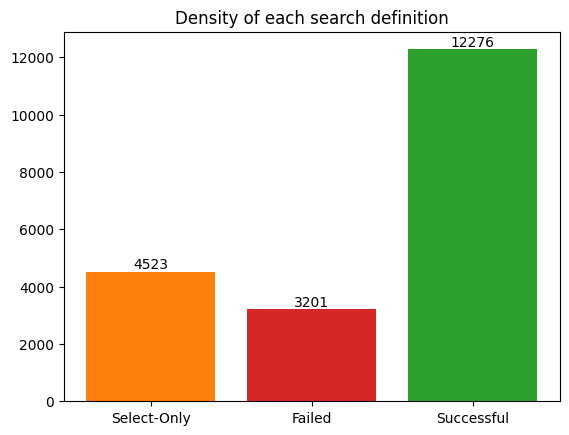

In [ ]:
fig, ax = plt.subplots()

labels = list(data['search_status'].unique())

values = []
for i in labels:
  values.append(len(data[data['search_status'] == i]))


bar_colors = ['tab:orange', 'tab:red', 'tab:green']

bar = ax.bar(labels, values, label=labels, color=bar_colors)
ax.bar_label(bar, fmt='%d')

ax.set_title('Density of each search definition')

plt.show()

#Metrics Analysis in Successfull searches (Matplotlib)

Text(0.5, 1.0, 'metric_rr')

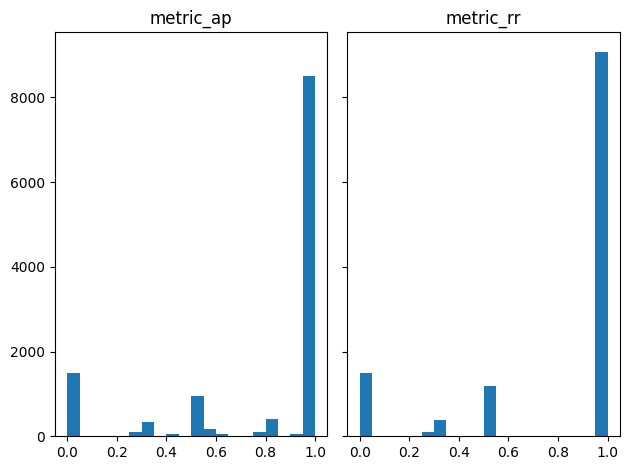

In [ ]:
data_successful = data[data['search_status'] == 'Successful']

fig, axs = plt.subplots(1, 2, sharey=True, tight_layout=True)

axs[0].hist(data_successful['metric_ap'], bins=20)
axs[0].set_title('metric_ap')
axs[1].hist(data_successful['metric_rr'], bins=20)
axs[1].set_title('metric_rr')

##Explaination: Most of AP and RR results above 0.6. This shows that the search engine performance is good enough.

#Metrics Analysis in Successfull searches (Seaborn)

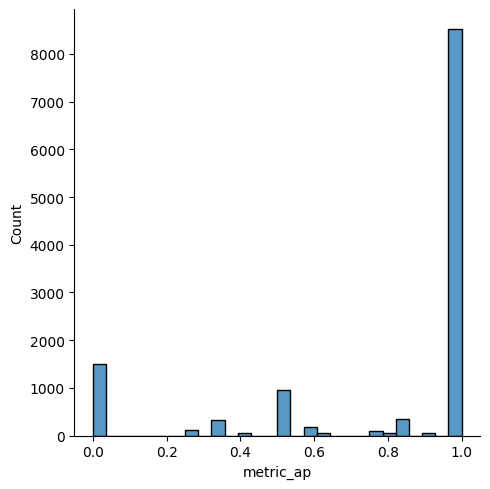

In [ ]:
data_successful = data[data['search_status'] == 'Successful']
sns.displot(data=data_successful, x="metric_ap")

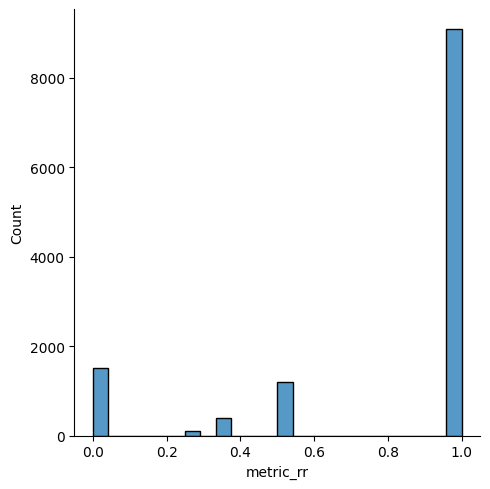

In [ ]:
sns.displot(data=data_successful, x="metric_rr")

#MAP and MRR Calculation

In [ ]:
data_successful = data[data['search_status'] == 'Successful']
mean_average_p = np.average(data_successful['metric_ap'])
mean_average_r = np.average(data_successful['metric_rr'])

print(mean_average_p,mean_average_r)

0.7953278302740667 0.801102422070164


#Plotting the relation between selected place index and metrics in successful searches

[Text(0, 0, '12528'),
 Text(0, 0, '2627'),
 Text(0, 0, '807'),
 Text(0, 0, '261'),
 Text(0, 0, '132'),
 Text(0, 0, '78'),
 Text(0, 0, '64'),
 Text(0, 0, '54'),
 Text(0, 0, '52'),
 Text(0, 0, '30'),
 Text(0, 0, '26'),
 Text(0, 0, '19'),
 Text(0, 0, '28'),
 Text(0, 0, '11'),
 Text(0, 0, '17'),
 Text(0, 0, '9'),
 Text(0, 0, '6'),
 Text(0, 0, '9'),
 Text(0, 0, '8'),
 Text(0, 0, '8'),
 Text(0, 0, '6'),
 Text(0, 0, '2'),
 Text(0, 0, '3'),
 Text(0, 0, '5'),
 Text(0, 0, '5'),
 Text(0, 0, '2'),
 Text(0, 0, '1')]

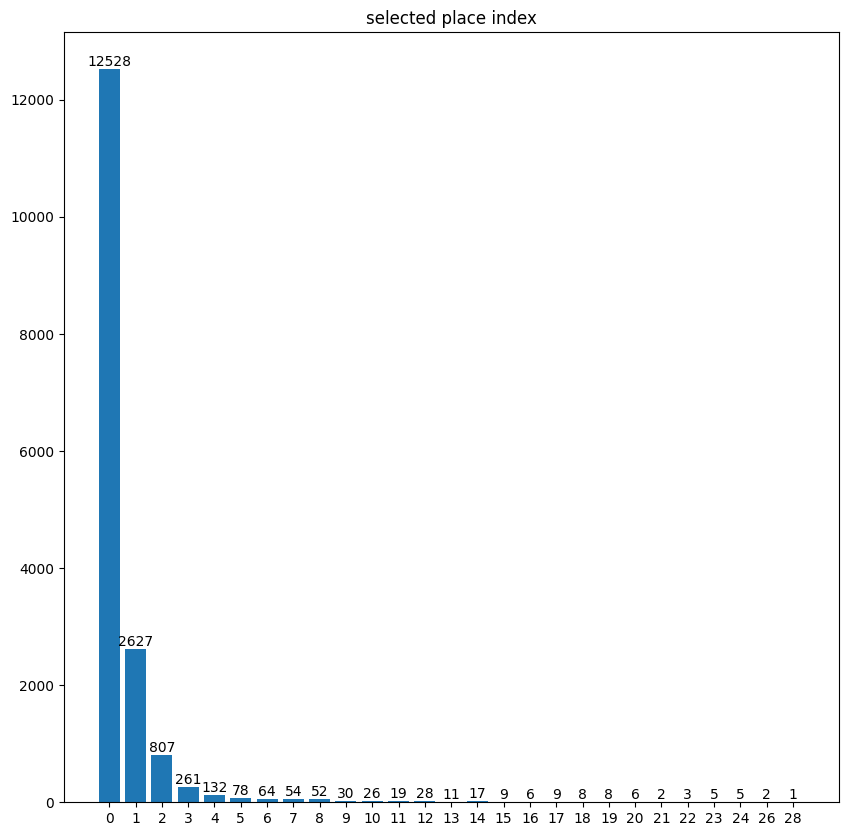

In [ ]:
data_successful = data[data['search_status'] == 'Successful']

fig, ax = plt.subplots(figsize=(10,10))

labels = [str(int(i)) for i in sorted(list(data_successful['selected_place_index'].unique()))]

values = []
for i in labels:
  values.append(len(data[data['selected_place_index'] == int(i)]))

bar = ax.bar(labels,values,label=labels)
ax.set_title('selected place index')
ax.bar_label(bar, fmt='%d')

#Plotting the relation between selected place index and metrics in successful searches (binning metrics in 2 bins : over and under 50 %)

In [ ]:
data['metric_ap>50'] = data['metric_ap'].apply(lambda x: x > 0.5)
data['metric_rr>50'] = data['metric_ap'].apply(lambda x: x > 0.5)

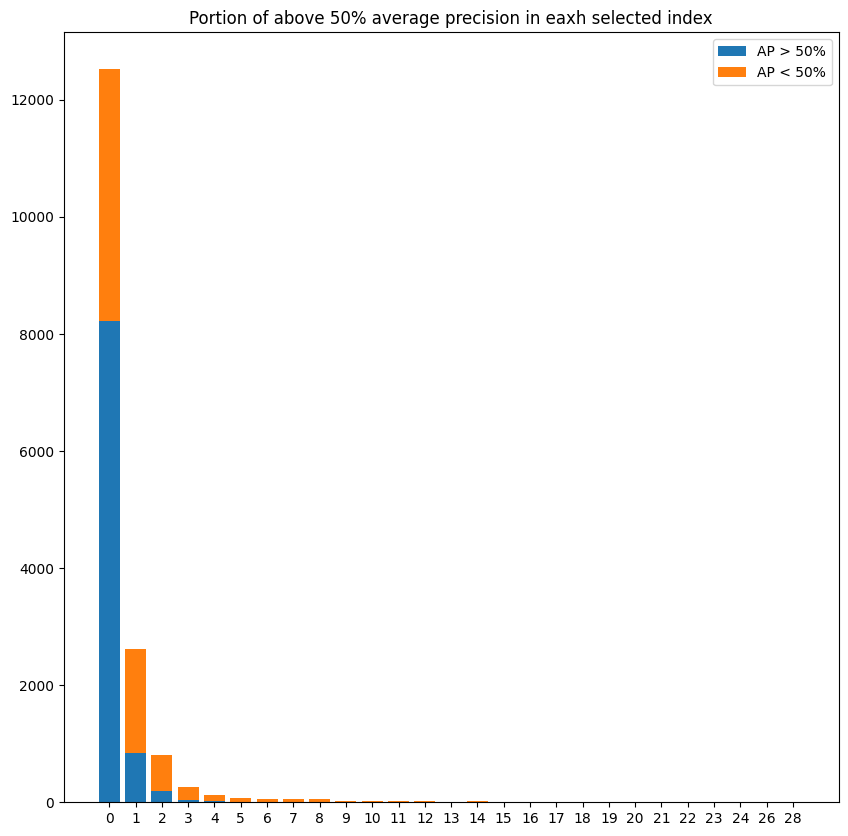

In [ ]:
labels = [str(int(i)) for i in sorted(list(data_successful['selected_place_index'].unique()))]

values_true = []
values_false = []

for i in labels:
  selected_data = data[data['selected_place_index'] == int(i)]
  values_true.append(len(selected_data[selected_data['metric_ap>50'] == True]))
  values_false.append(len(selected_data[selected_data['metric_ap>50'] == False]))

weight_counts = {
    "AP > 50%": np.array(values_true),
    "AP < 50%": np.array(values_false),
}
width = 0.8

fig, ax = plt.subplots(figsize=(10,10))
bottom = np.zeros(27)

for boolean, weight_count in weight_counts.items():
    p = ax.bar(labels, weight_count, width, label=boolean, bottom=bottom)
    bottom += weight_count

ax.set_title("Portion of above 50% average precision in eaxh selected index")
ax.legend(loc="upper right")

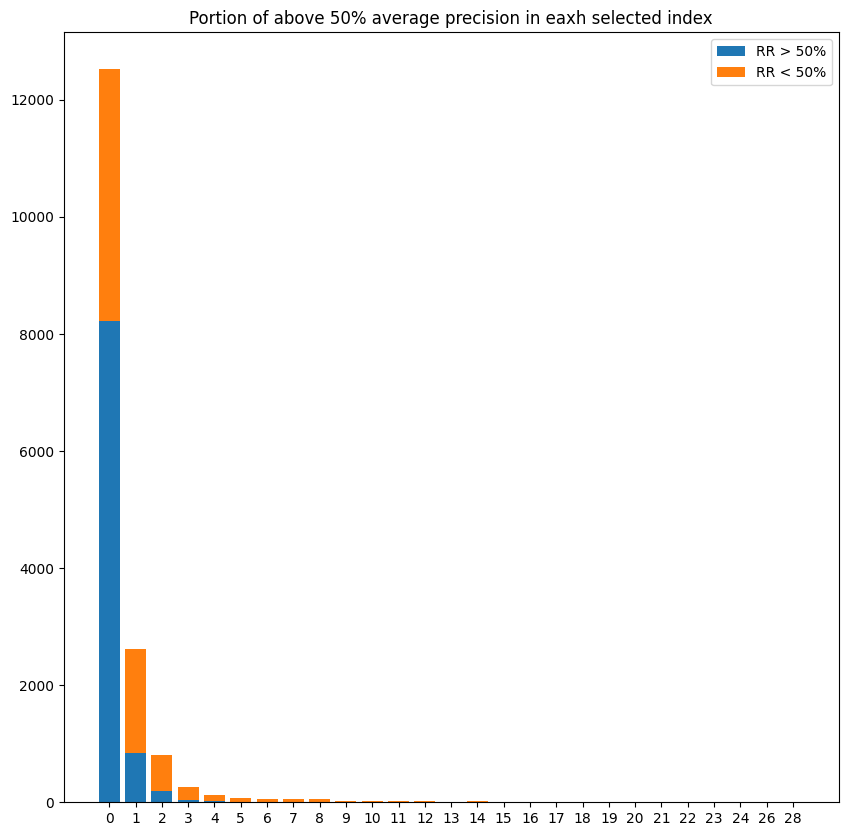

In [ ]:
labels = [str(int(i)) for i in sorted(list(data_successful['selected_place_index'].unique()))]

values_true = []
values_false = []

for i in labels:
  selected_data = data[data['selected_place_index'] == int(i)]
  values_true.append(len(selected_data[selected_data['metric_rr>50'] == True]))
  values_false.append(len(selected_data[selected_data['metric_rr>50'] == False]))

weight_counts = {
    "RR > 50%": np.array(values_true),
    "RR < 50%": np.array(values_false),
}
width = 0.8

fig, ax = plt.subplots(figsize=(10,10))
bottom = np.zeros(27)

for boolean, weight_count in weight_counts.items():
    p = ax.bar(labels, weight_count, width, label=boolean, bottom=bottom)
    bottom += weight_count

ax.set_title("Portion of above 50% average precision in eaxh selected index")
ax.legend(loc="upper right")

# Plotting the mean of metrics over each "selected index category"

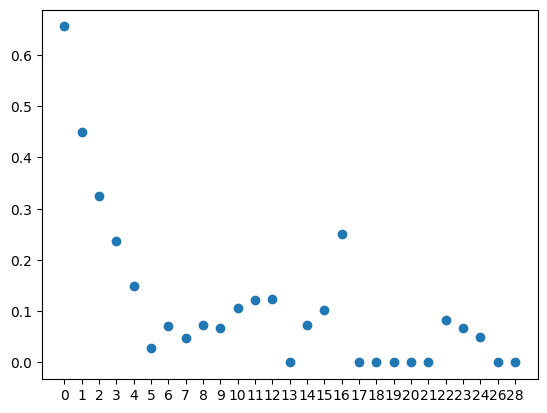

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

data_successful = data[data['search_status'] == 'Successful']

labels = [str(int(i)) for i in sorted(list(data_successful['selected_place_index'].unique()))]
values = []
for i in labels:
  values.append(np.average(data[data['selected_place_index'] == int(i)]['metric_ap']))

xpoints = np.array(labels)
ypoints = np.array(values)

plt.plot(xpoints, ypoints, 'o')
plt.show()

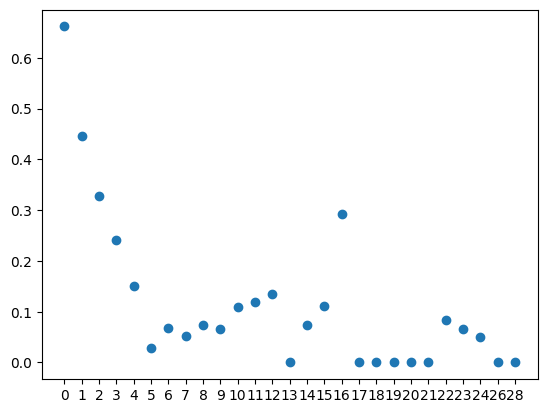

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

data_successful = data[data['search_status'] == 'Successful']

labels = [str(int(i)) for i in sorted(list(data_successful['selected_place_index'].unique()))]
values = []
for i in labels:
  values.append(np.average(data[data['selected_place_index'] == int(i)]['metric_rr']))

xpoints = np.array(labels)
ypoints = np.array(values)

plt.plot(xpoints, ypoints, 'o')
plt.show()

## Maximum average of both metrics happens in searches in which user select first result. So, Showing the best result in first place is very important in search engine performance.

#Plotting the search status counts over each hour of a day

In [ ]:
data['date_time'] = data['timestamp'].apply(lambda x: pd.to_datetime(x,format='%Y-%m-%d %H:%M:%S'))
data['hour'] = data.date_time.dt.hour

Select-Only
Failed
Successful


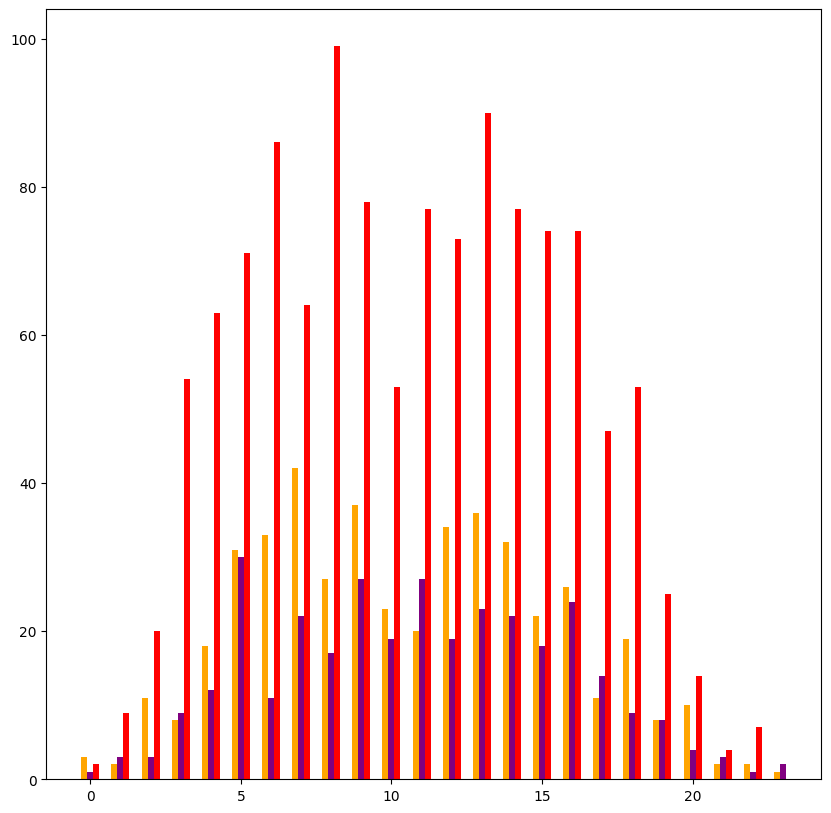

In [ ]:
search_types = list(data['search_status'].unique())

keys = []
values = []

for i in search_types:
  print(i)
  data_i = list(data[data['search_status'] == i]['hour'])
  word_len_list = [hour for hour in data_i]
  counter_dict_of_len_list = Counter(word_len_list)
  keys.append(np.array(list(counter_dict_of_len_list.keys())))
  values.append(np.array(list(counter_dict_of_len_list.values())))


fig, ax = plt.subplots(figsize=(10,10))
ax.bar(keys[0] - 0.2,values[0], width=0.2, color='orange', align='center')
ax.bar(keys[1], values[1], width=0.2, color='purple', align='center')
ax.bar(keys[2] + 0.2, values[2], width=0.2, color='red', align='center')

plt.show()

from 20 PM to 2 AM the number of successfull searches considerably decreases.

#Removing the null search inputs

In [ ]:
data = data[~data['search_input'].isna()]

#Plotting the word cloud of each search category

Select-Only


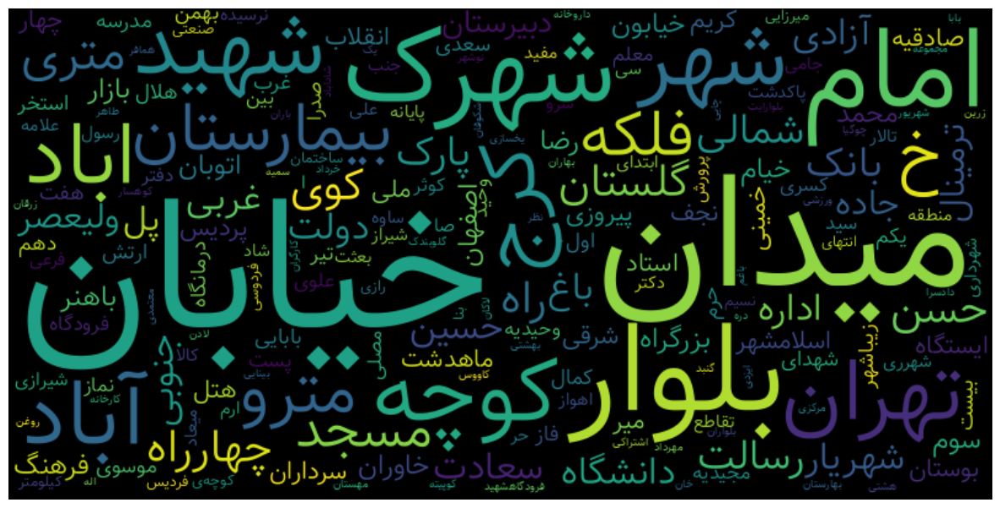

Failed


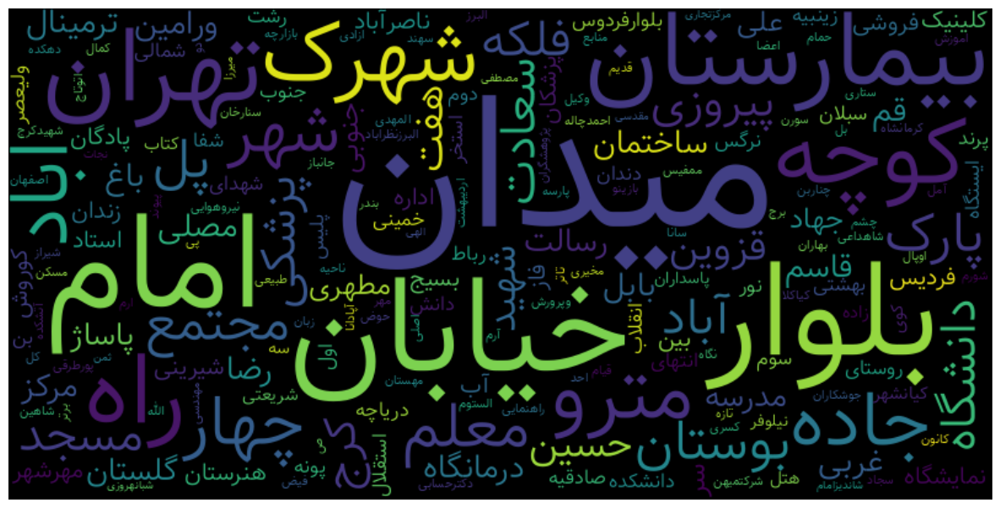

Successful


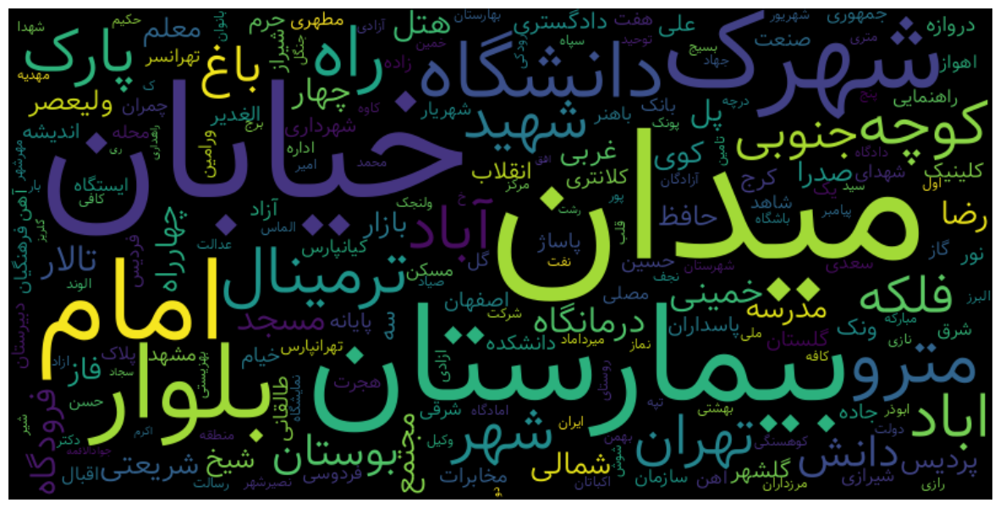

In [ ]:
search_types = list(data['search_status'].unique())
wordcloud = WordCloudFa(no_reshape=True, persian_normalize=True, include_numbers=False, collocations=False, width=800, height=400)

for i in search_types:
  print(i)
  inputs = list(data[data['search_status'] == i]['search_input'])
  text = " ".join(t for t in inputs)
  wc = wordcloud.generate(text)
  plt.figure(figsize=(15,10))
  plt.imshow(wc, interpolation='bilinear')
  plt.axis("off")
  plt.show()

#Plotting the search input length over each search category

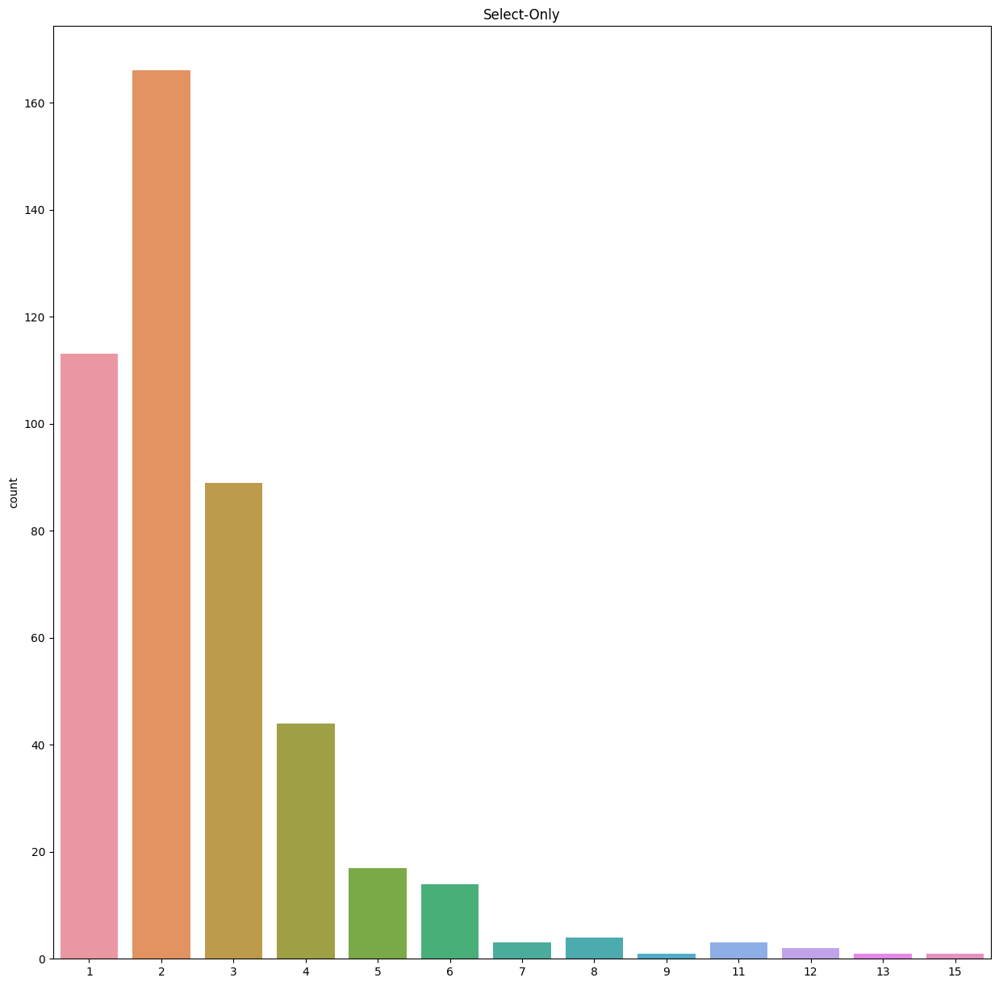

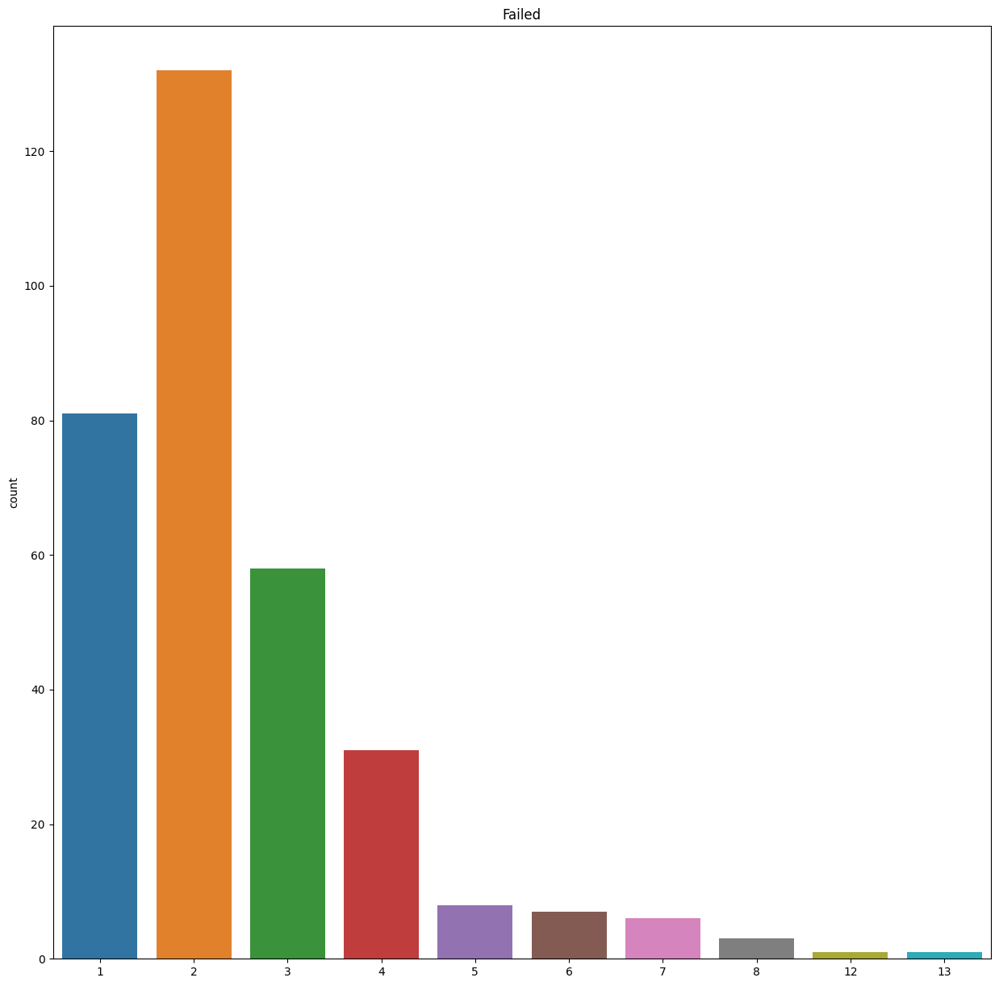

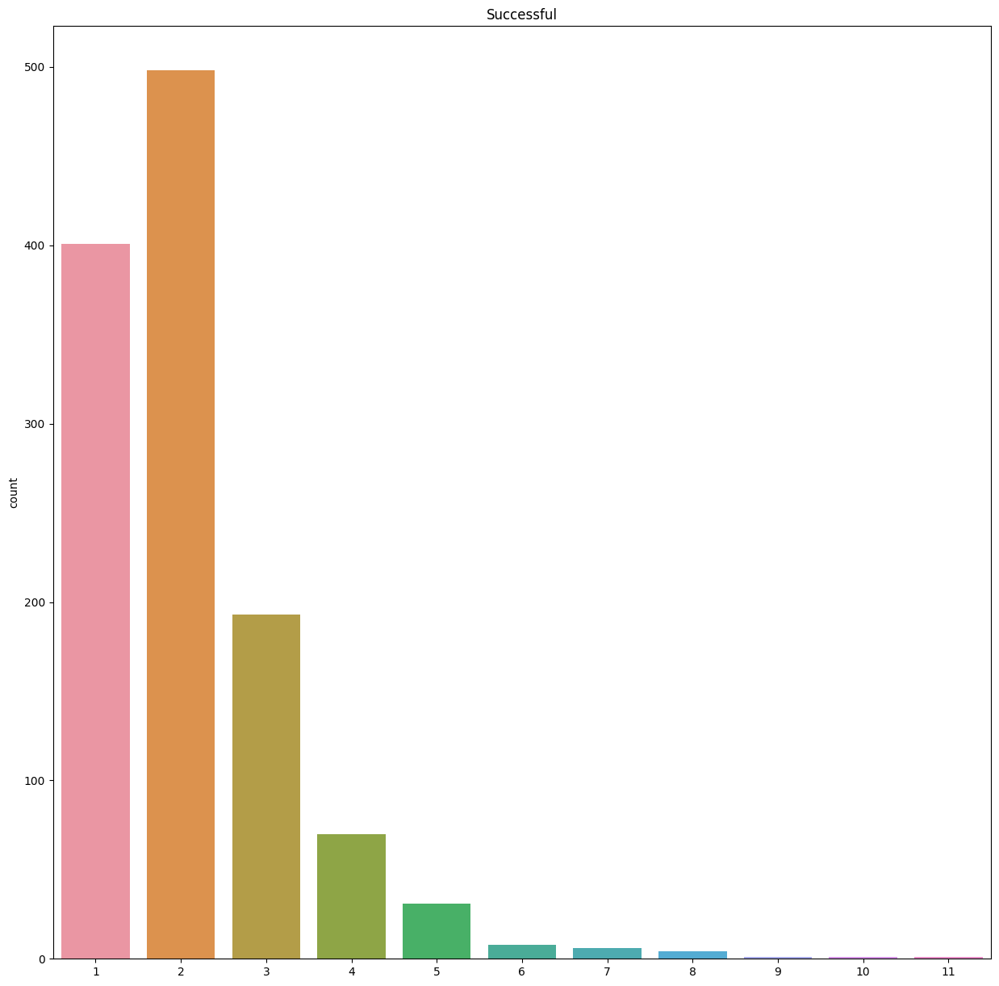

In [ ]:
search_types = list(data['search_status'].unique())
wordcloud = WordCloudFa(no_reshape=True, persian_normalize=True, include_numbers=False, collocations=False, width=800, height=400)
for i in search_types:
  fig, ax = plt.subplots(figsize=(15,15))
  data_i = list(data[data['search_status'] == i]['search_input'])
  lengths = [len(word.split()) for word in data_i]
  sns.countplot(x=lengths)
  ax.set_title(i)
  plt.show()

##Mixing The plots

Select-Only
Failed
Successful


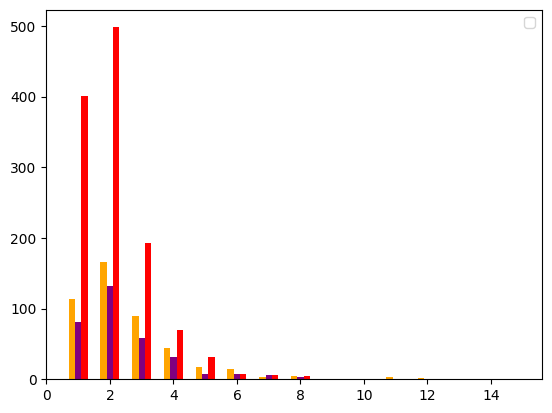

In [ ]:
search_types = list(data['search_status'].unique())

keys = []
values = []

for i in search_types:
  print(i)
  data_i = list(data[data['search_status'] == i]['search_input'])
  word_len_list = [len(word.split()) for word in data_i]
  counter_dict_of_len_list = Counter(word_len_list)
  keys.append(np.array(list(counter_dict_of_len_list.keys())))
  values.append(np.array(list(counter_dict_of_len_list.values())))


fig, ax = plt.subplots()
ax.bar(keys[0] - 0.2,values[0], width=0.2, color='orange', align='center')
ax.bar(keys[1], values[1], width=0.2, color='purple', align='center')
ax.bar(keys[2] + 0.2, values[2], width=0.2, color='red', align='center')
plt.show()

#Word Cloud for each search lengths

<ipython-input-142-ec8ef2e49854>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['length_search_input'] = data['search_input'].apply(lambda x: len(x.split()))


1 595 401 0.6739495798319328


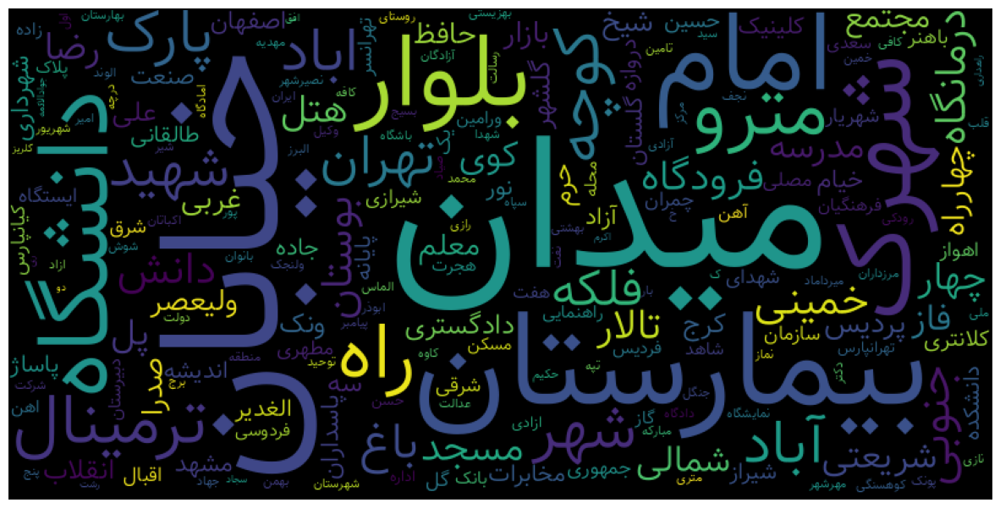

2 796 498 0.6256281407035176


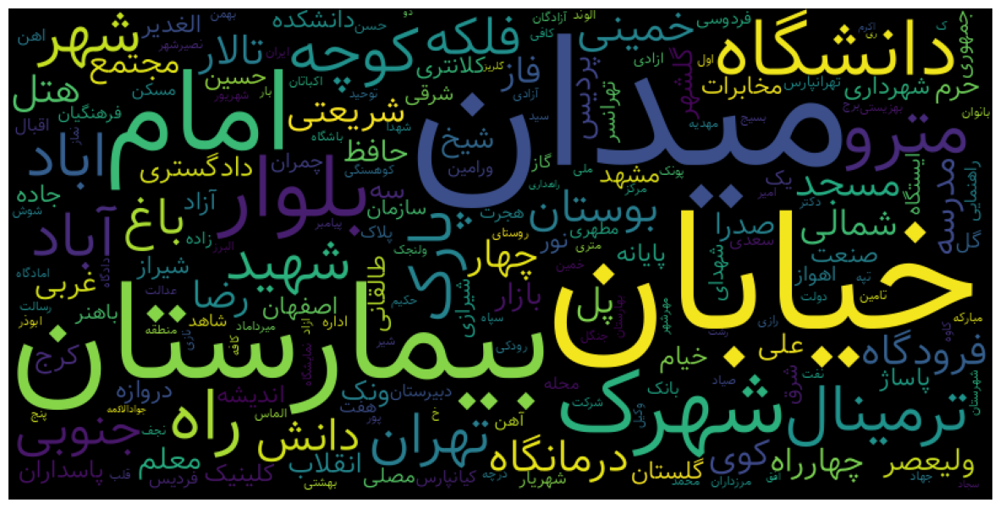

3 340 193 0.5676470588235294


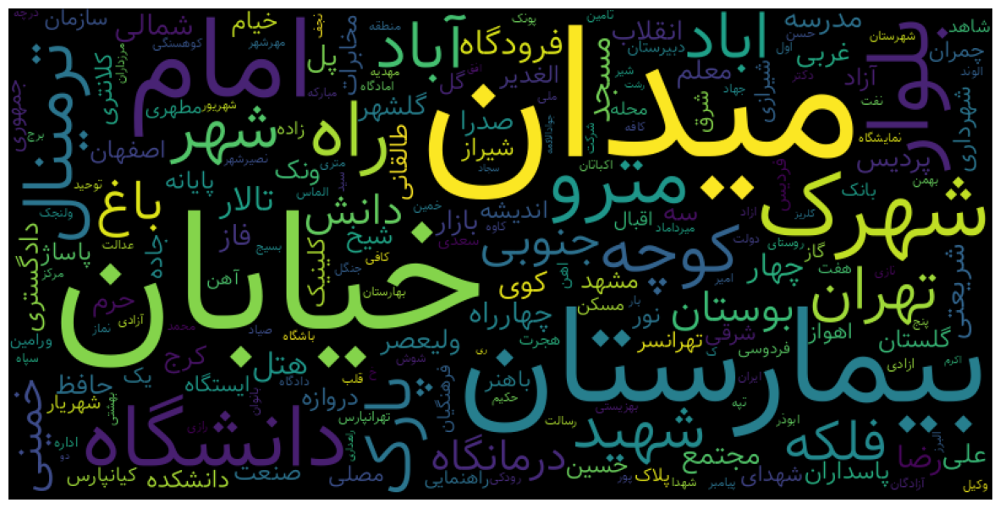

4 145 70 0.4827586206896552


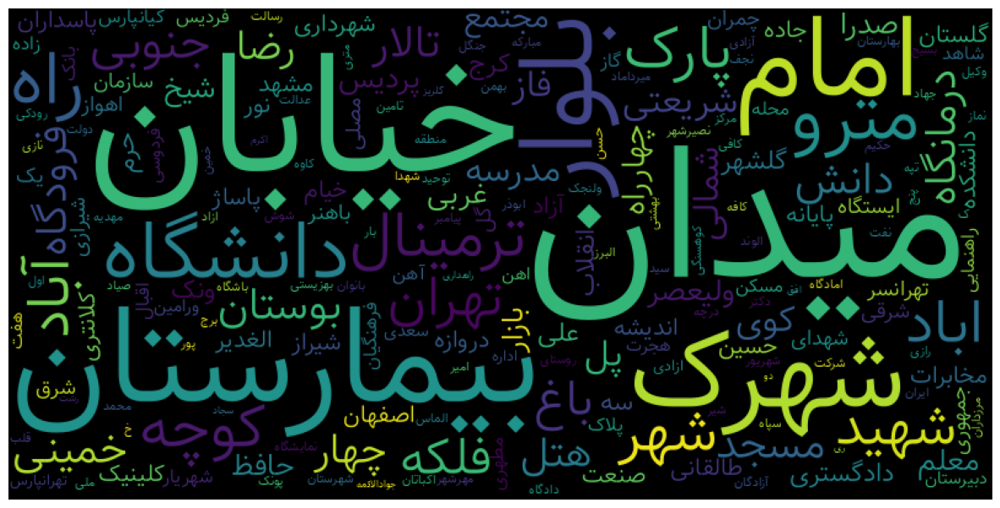

5 56 31 0.5535714285714286


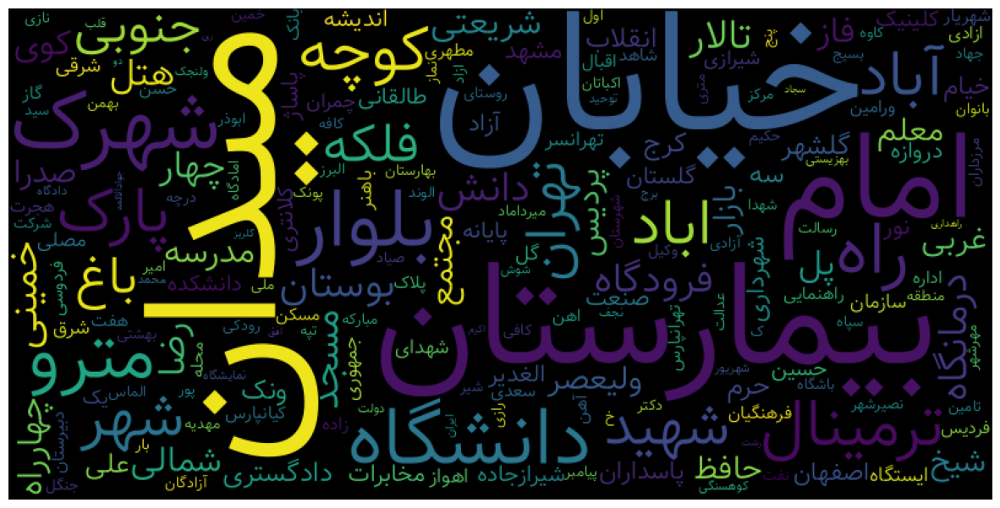

6 29 8 0.27586206896551724


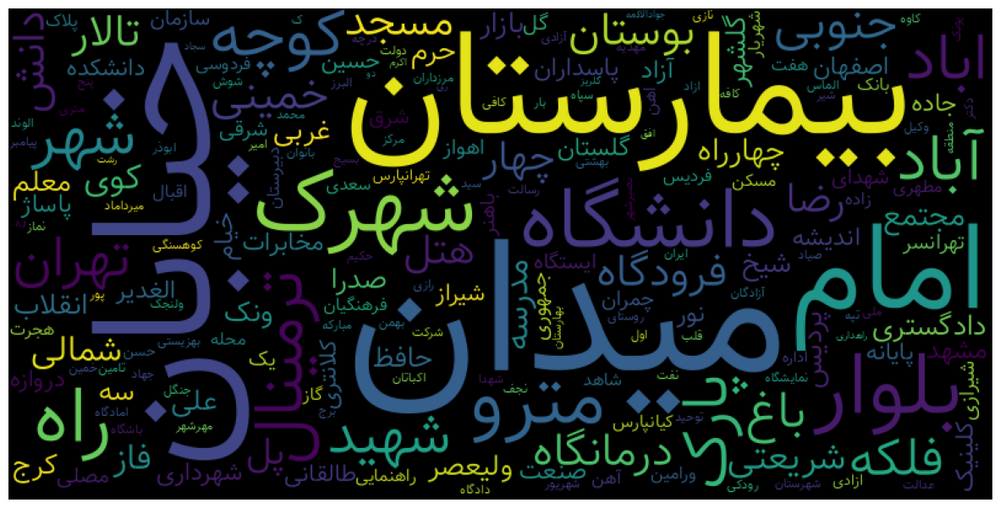

7 15 6 0.4


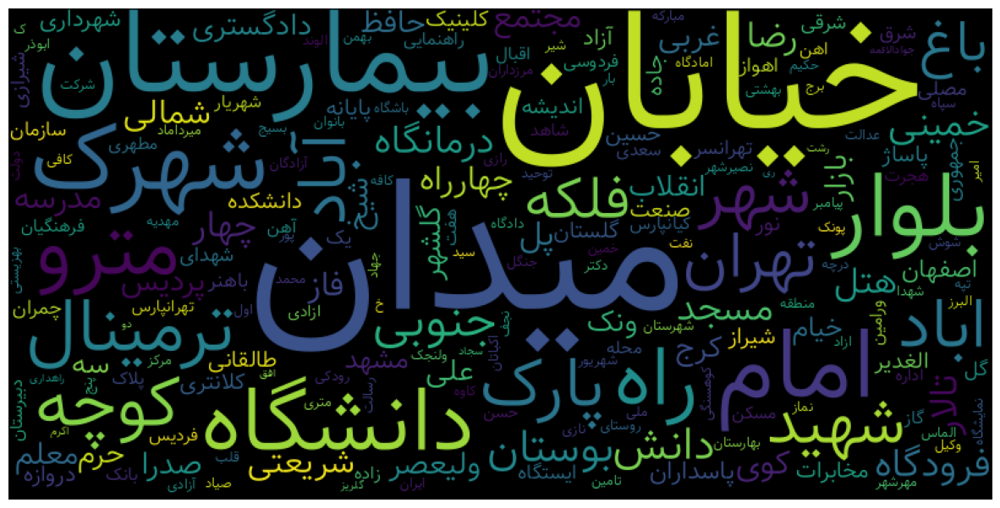

8 11 4 0.36363636363636365


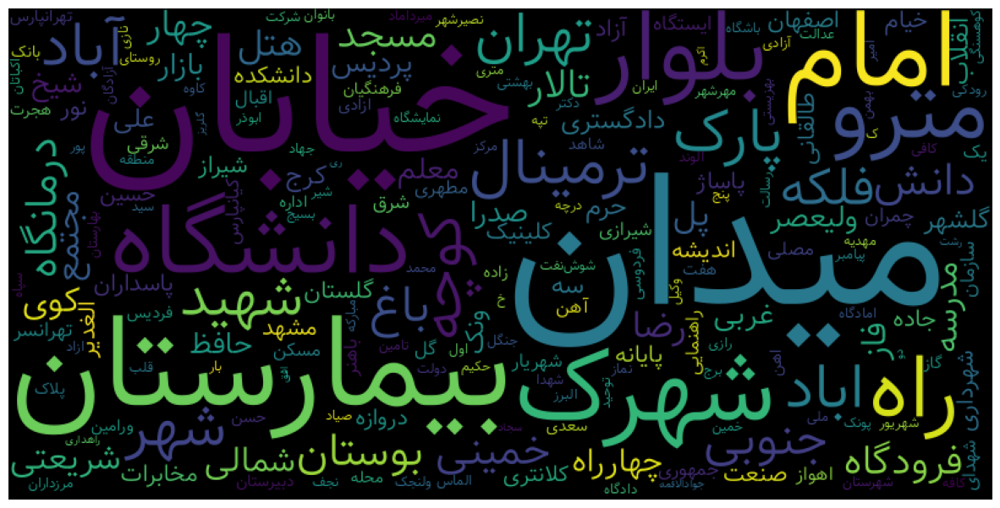

9 2 1 0.5


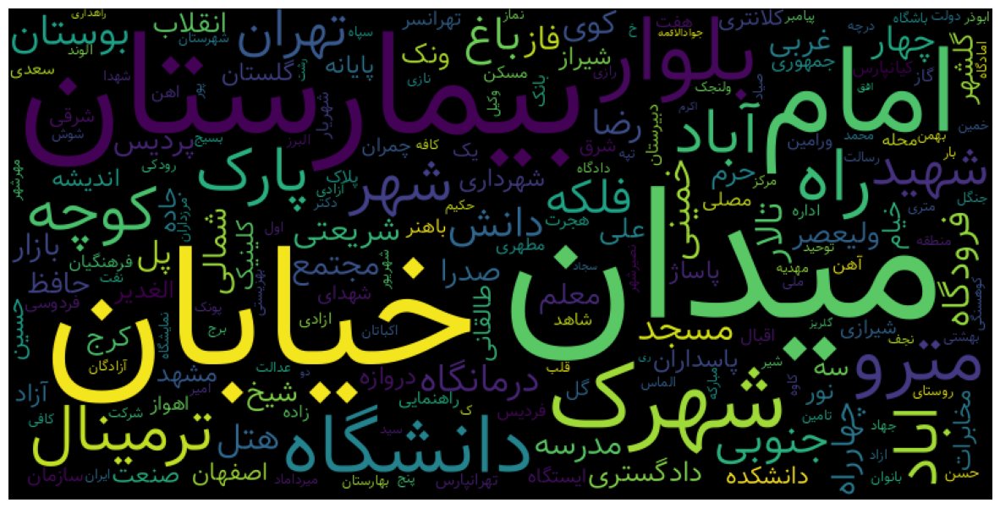

10 1 1 1.0


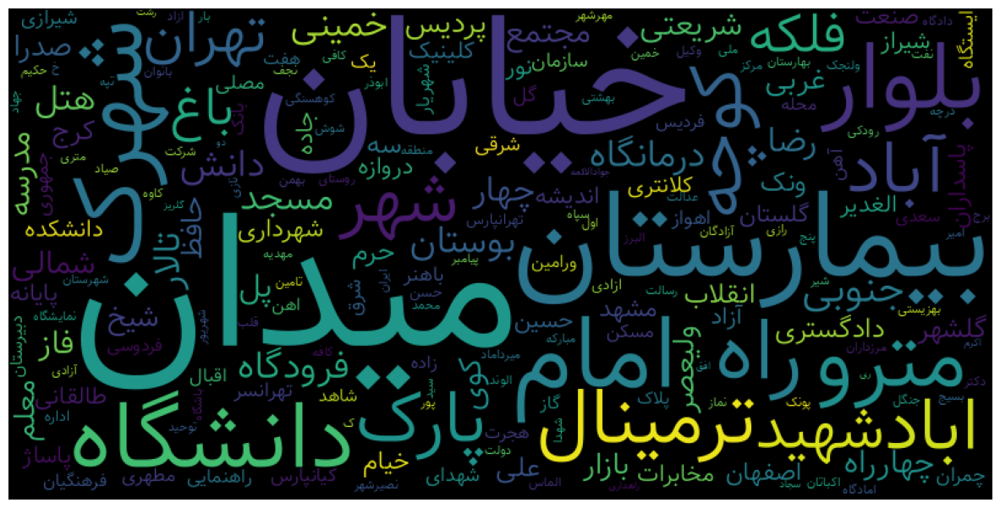

11 4 1 0.25


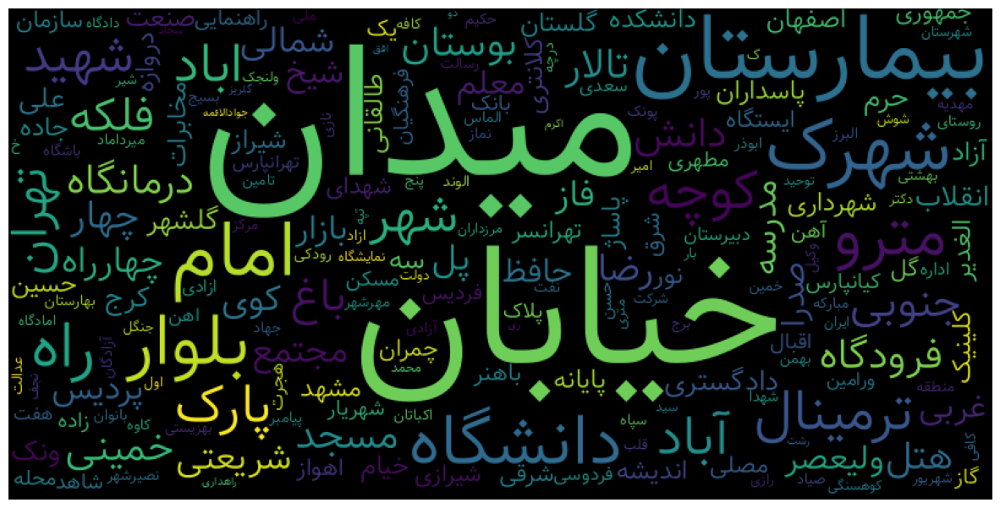

12 3 0 0.0


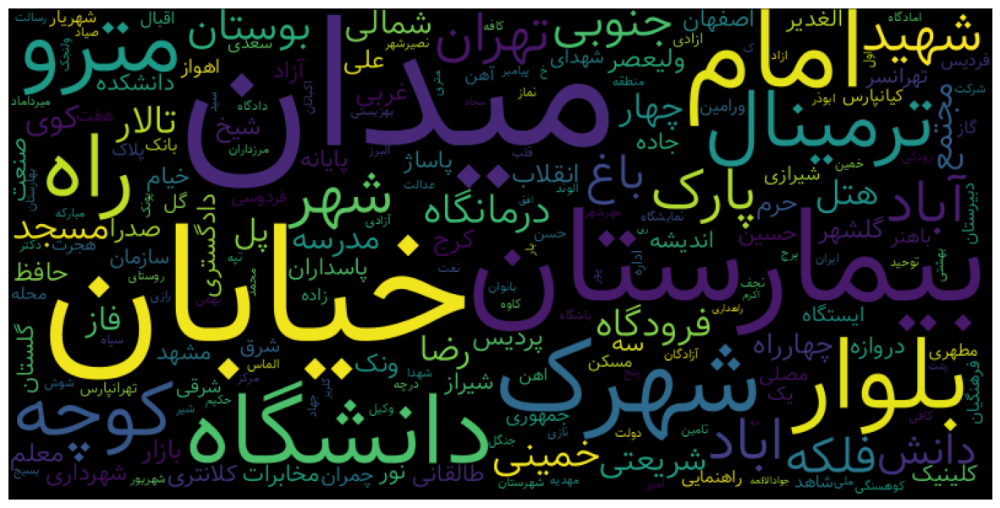

13 2 0 0.0


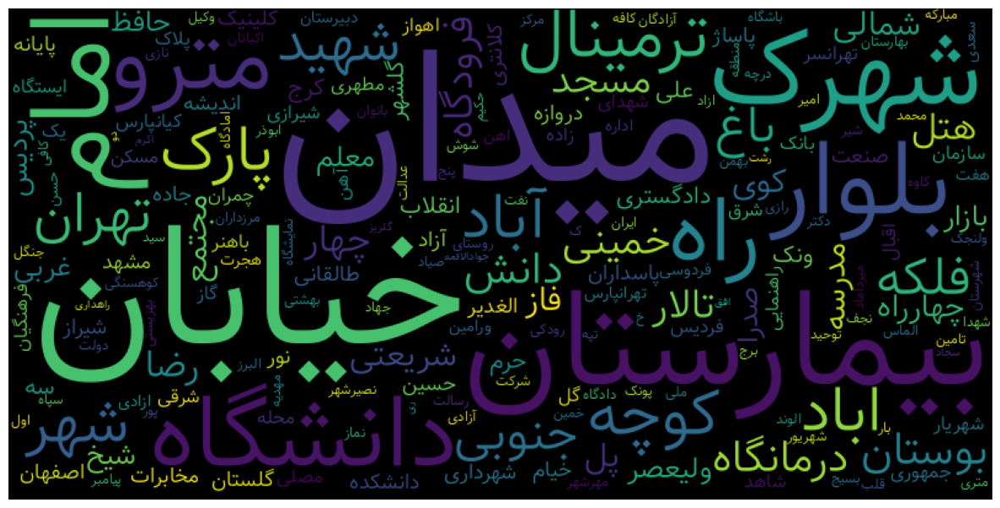

15 1 0 0.0


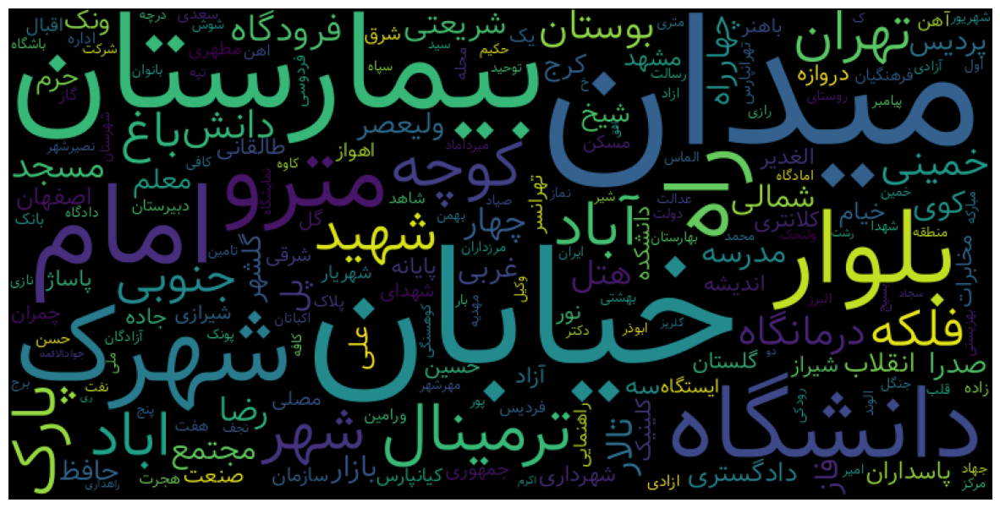

In [ ]:
data['length_search_input'] = data['search_input'].apply(lambda x: len(x.split()))
length_search_input = sorted(list(data['length_search_input'].unique()))

keys = []
values = []

for i in length_search_input:
  data_i = data[data['length_search_input'] == i][['search_input','search_status']]
  data_j = data_i[data_i['search_status'] == 'Successful']
  print(i,len(data_i),len(data_j),len(data_j)/len(data_i))
  text = " ".join(t for t in inputs)
  wc = wordcloud.generate(text)
  plt.figure(figsize=(15,10))
  plt.imshow(wc)
  plt.axis("off")
  plt.show()

In [ ]:
data[data['length_search_input']==12]

,Unnamed: 0,search_input,timestamp,attempt_id,user_location,selected_place_index,selected_place_location,pin_location,metric_ap,metric_rr,search_status,metric_ap>50,metric_rr>50,date_time,hour,length_search_input
456,456,ضلع شمالی بزرگراه رسالت بین مجیدیه شمالی وصیاد...,2023-05-20 12:12:58,9c27727a-8088-4676-952f-5d7b61415877,"35.5169303,51.36055590000001",1.0,"35.7330786,51.5145598",Undefined,0.0,0.0,Select-Only,False,False,2023-05-20 12:12:58,12.0,12
769,769,درواز دولت خیابان طیبب. خیابان میر داماد مطب د...,2023-05-20 15:16:39,86f7b7b2-c250-41e7-9bdc-aa9785201280,"32.63381658785083,51.67082365933723",0.0,"32.6578028,51.6693649",Undefined,0.0,0.0,Select-Only,False,False,2023-05-20 15:16:39,15.0,12
1901,1901,خانی آباد نو خیابان میثاق شمالی خ نیلوفر جنب م...,2023-05-20 14:15:37,2b3acb2c-15bd-461c-8833-85131ffeff08,NaN,-1.0,NaN,Undefined,-1.0,-1.0,Failed,False,False,2023-05-20 14:15:37,14.0,12


## Most of search content in all categories contains 'میدان' , 'خیابان' ...

## Those which ended in failed status, are too long (complete examples)
## Some of them are wrongly spelled or includes signs like - or ()

#**Snap map - 2nd try - not completed**



*   Please note that metric_ap and metric_rr are calculated previously and given to you. They are metrics of search performance. A good search
result has metric_ap and metric_rr both equal to 1

*   pin_location is the final location on the map which users have selected as origin or destination of their ride.it is not necessarily equal
to  selected_place_location, as the user may move the pin after selecting the result

*  metric_rr and metric_ap are only calculated for searches with the pin location. These searches are called Successful

*   There are some searches which have not ended with selecting a result. We call these searches as Failed.

*   There are searches with a selection but no pin location. We call these searches Select-Only.

*  The NaN (Empty) values are meaningful. For example a search with selected_place_index but with NaN (Empty) in the pin_location shows that
this search has not reached to pin and is Select-only







##Importing library

In [ ]:
import pandas as pd
import numpy as np

##Loading the dataset


In [ ]:
data = pd.read_csv('Data_Analyst_Assigment.csv')
data

,Unnamed: 0,search_input,timestamp,attempt_id,user_location,selected_place_index,selected_place_location,pin_location,metric_ap,metric_rr
0,0,بلوارایت اله ایزدی,2023-05-20 03:50:50,5fb445c4-760e-4956-a9be-d429de6c5c75,"32.4251125,51.3261579",0.0,"32.6306106,51.4016186",NaN,0.000000,0.000000
1,1,کلینیک چشم پزشکی نگاه,2023-05-20 09:39:07,b975bfef-de5f-430d-9230-5bb71a36e0b3,NaN,NaN,NaN,NaN,NaN,NaN
2,2,سازمان راهداری و حمل و نقل جاده ای,2023-05-20 05:42:01,15de915c-e26d-42a2-a076-b1006cd536fd,"35.746677000000005,51.42000200000001",0.0,NaN,"35.709445999999964,51.405190000000005",1.000000,1.000000
3,3,تهران مترو خيام,2023-05-20 12:01:37,57e82b9d-94f0-4e0f-a9d1-aa60c1f51e52,"35.82748676814743,50.97467422485352",2.0,NaN,"35.67380742811089,51.41375720500947",0.416667,0.333333
4,4,کرج میدان,2023-05-20 18:02:16,ec2586f3-ce0f-424a-98c2-82c583b097ca,"35.8113711,51.0059891",0.0,"35.8122984,51.0074763",NaN,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...
19995,1995,NaN,NaN,420d8fbf-a953-4a9c-ab58-e298e930e863,NaN,NaN,NaN,NaN,NaN,NaN
19996,1996,NaN,NaN,d3c226f9-3d38-4ed6-8834-b6331e4ba8a8,"37.274473,49.55868399999997",0.0,NaN,"37.25796900000001,49.57179400000001",1.000000,1.000000
19997,1997,NaN,NaN,7b5d9c1d-c478-4670-a2be-a959aada0c1b,"35.645784898990414,51.325687598617776",1.0,NaN,"35.77019937471258,51.30129235413338",0.500000,0.500000
19998,1998,NaN,NaN,b4ae0490-9db0-4faf-9838-dde90ce42484,"35.75644523765672,51.328334071417686",1.0,NaN,"35.79111399999999,51.35799299999999",0.500000,0.500000


In [ ]:
data = data.drop(['Unnamed: 0', 'attempt_id'],axis=1)

##Data Preprocessing

## Remove rows in which all columns are null

In [ ]:
data = data.dropna(axis = 0, how = 'all')
data

,search_input,timestamp,user_location,selected_place_index,selected_place_location,pin_location,metric_ap,metric_rr
0,بلوارایت اله ایزدی,2023-05-20 03:50:50,"32.4251125,51.3261579",0.0,"32.6306106,51.4016186",NaN,0.000000,0.000000
1,کلینیک چشم پزشکی نگاه,2023-05-20 09:39:07,NaN,NaN,NaN,NaN,NaN,NaN
2,سازمان راهداری و حمل و نقل جاده ای,2023-05-20 05:42:01,"35.746677000000005,51.42000200000001",0.0,NaN,"35.709445999999964,51.405190000000005",1.000000,1.000000
3,تهران مترو خيام,2023-05-20 12:01:37,"35.82748676814743,50.97467422485352",2.0,NaN,"35.67380742811089,51.41375720500947",0.416667,0.333333
4,کرج میدان,2023-05-20 18:02:16,"35.8113711,51.0059891",0.0,"35.8122984,51.0074763",NaN,0.000000,0.000000
...,...,...,...,...,...,...,...,...
19993,NaN,NaN,"33.96260505212175,51.47720621434087",0.0,NaN,"33.98453535000004,51.412919879380894",1.000000,1.000000
19994,NaN,NaN,"36.3024881,59.5318102",0.0,NaN,"36.301239800000005,59.53322980000004",1.000000,1.000000
19996,NaN,NaN,"37.274473,49.55868399999997",0.0,NaN,"37.25796900000001,49.57179400000001",1.000000,1.000000
19997,NaN,NaN,"35.645784898990414,51.325687598617776",1.0,NaN,"35.77019937471258,51.30129235413338",0.500000,0.500000


In [ ]:
data = data.dropna(subset=['search_input'])
data

,search_input,timestamp,user_location,selected_place_index,selected_place_location,pin_location,metric_ap,metric_rr
0,بلوارایت اله ایزدی,2023-05-20 03:50:50,"32.4251125,51.3261579",0.0,"32.6306106,51.4016186",NaN,0.000000,0.000000
1,کلینیک چشم پزشکی نگاه,2023-05-20 09:39:07,NaN,NaN,NaN,NaN,NaN,NaN
2,سازمان راهداری و حمل و نقل جاده ای,2023-05-20 05:42:01,"35.746677000000005,51.42000200000001",0.0,NaN,"35.709445999999964,51.405190000000005",1.000000,1.000000
3,تهران مترو خيام,2023-05-20 12:01:37,"35.82748676814743,50.97467422485352",2.0,NaN,"35.67380742811089,51.41375720500947",0.416667,0.333333
4,کرج میدان,2023-05-20 18:02:16,"35.8113711,51.0059891",0.0,"35.8122984,51.0074763",NaN,0.000000,0.000000
...,...,...,...,...,...,...,...,...
1995,دانشکده شهید,2023-05-20 04:51:17,"35.648270000000025,51.41741999999996",0.0,NaN,"35.702960999999995,51.40856600000001",1.000000,1.000000
1996,رسالت,2023-05-20 05:45:24,"31.344528,48.717236000000014",0.0,"31.2959223,48.7455315",NaN,0.000000,0.000000
1997,رحمت اباد,2023-05-20 04:03:33,"29.683810999999967,52.455036000000035",0.0,"29.6243922,52.5133824",NaN,0.000000,0.000000
1998,مرزداران،برج‌ الوند,2023-05-20 12:25:29,"35.7176449,51.3454669",0.0,NaN,"35.73380590000001,51.34507980000001",0.805556,1.000000


## Define search categories -> successful / failed / select-only

In [ ]:
def search_category(row):
  if not pd.isnull(row['pin_location']):
    return 'Successful'
  if pd.isnull(row['pin_location']) and not pd.isnull(row['selected_place_index']):
    return 'Select-Only'
  if pd.isnull(row['pin_location']) and pd.isnull(row['selected_place_index']):
    return 'Failed'

categories = []
for i,r in data.iterrows():
  categories.append(search_category(r))

data['search_type'] = categories
data

<ipython-input-6-94db72d14446>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['search_type'] = categories


,search_input,timestamp,user_location,selected_place_index,selected_place_location,pin_location,metric_ap,metric_rr,search_type
0,بلوارایت اله ایزدی,2023-05-20 03:50:50,"32.4251125,51.3261579",0.0,"32.6306106,51.4016186",NaN,0.000000,0.000000,Select-Only
1,کلینیک چشم پزشکی نگاه,2023-05-20 09:39:07,NaN,NaN,NaN,NaN,NaN,NaN,Failed
2,سازمان راهداری و حمل و نقل جاده ای,2023-05-20 05:42:01,"35.746677000000005,51.42000200000001",0.0,NaN,"35.709445999999964,51.405190000000005",1.000000,1.000000,Successful
3,تهران مترو خيام,2023-05-20 12:01:37,"35.82748676814743,50.97467422485352",2.0,NaN,"35.67380742811089,51.41375720500947",0.416667,0.333333,Successful
4,کرج میدان,2023-05-20 18:02:16,"35.8113711,51.0059891",0.0,"35.8122984,51.0074763",NaN,0.000000,0.000000,Select-Only
...,...,...,...,...,...,...,...,...,...
1995,دانشکده شهید,2023-05-20 04:51:17,"35.648270000000025,51.41741999999996",0.0,NaN,"35.702960999999995,51.40856600000001",1.000000,1.000000,Successful
1996,رسالت,2023-05-20 05:45:24,"31.344528,48.717236000000014",0.0,"31.2959223,48.7455315",NaN,0.000000,0.000000,Select-Only
1997,رحمت اباد,2023-05-20 04:03:33,"29.683810999999967,52.455036000000035",0.0,"29.6243922,52.5133824",NaN,0.000000,0.000000,Select-Only
1998,مرزداران،برج‌ الوند,2023-05-20 12:25:29,"35.7176449,51.3454669",0.0,NaN,"35.73380590000001,51.34507980000001",0.805556,1.000000,Successful


##  the density of each search definition Successful/ Failed/ Select-Only

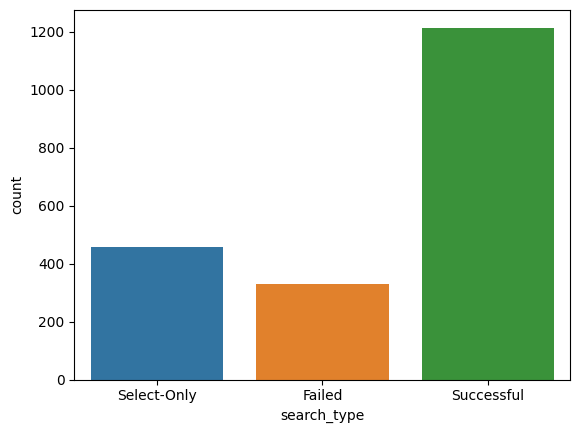

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


# count plot on single categorical variable
sns.countplot(x ='search_type', data = data, hue="search_type")

# Show the plot
plt.show()

## Mean Recirocal Rank (Mrr) and Mean Average Precision (MAP) for Successful searches.

In [ ]:
data_successful = data[data['search_type'] == 'Successful']

mean_MRR = np.mean(data_successful['metric_rr'])
mean_MAP = np.mean(data_successful['metric_ap'])

print('Mean Average Precision', '\t', mean_MAP)
print('Mean Recirocal Rank', '\t', mean_MRR)

Mean Average Precision 	 0.7814616511074501
Mean Recirocal Rank 	 0.7874107633168589


Text(0.5, 1.0, 'metric_rr')

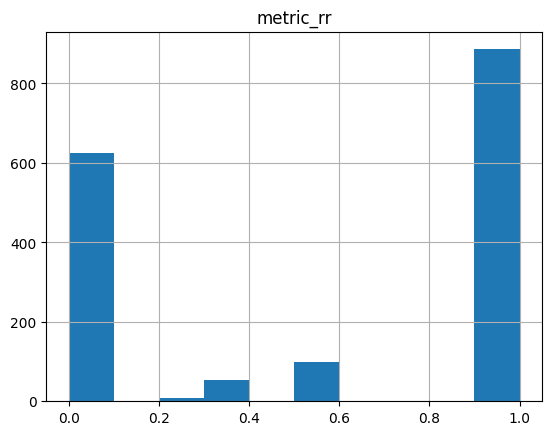

In [ ]:
data['metric_rr'].hist()

plt.title('metric_rr')

Text(0.5, 1.0, 'metric_ap')

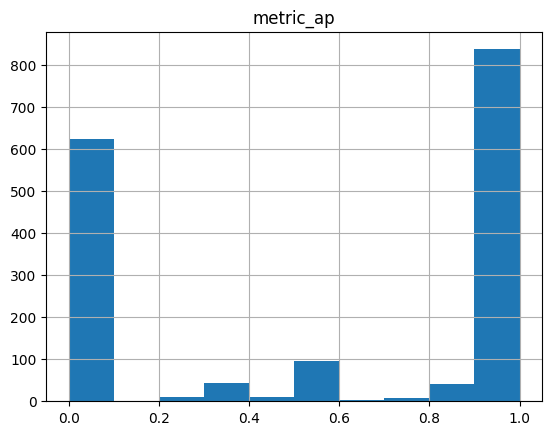

In [ ]:
data['metric_ap'].hist()

plt.title('metric_ap')

*  What is the relation of the search metrics with the
   selected_place_index?


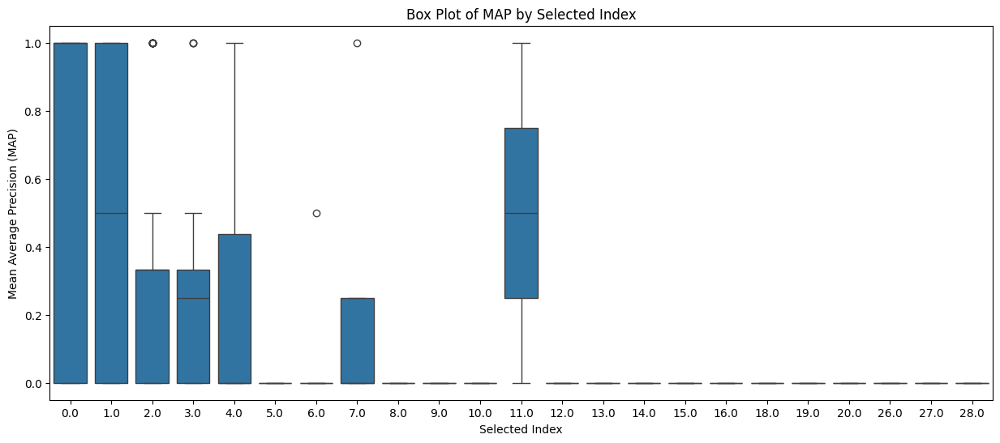

In [ ]:
plt.figure(figsize=(15, 6))
sns.boxplot(x='selected_place_index', y='metric_rr', data=data)
plt.title('Box Plot of MAP by Selected Index')
plt.xlabel('Selected Index')
plt.ylabel('Mean Average Precision (MAP)')
plt.show()

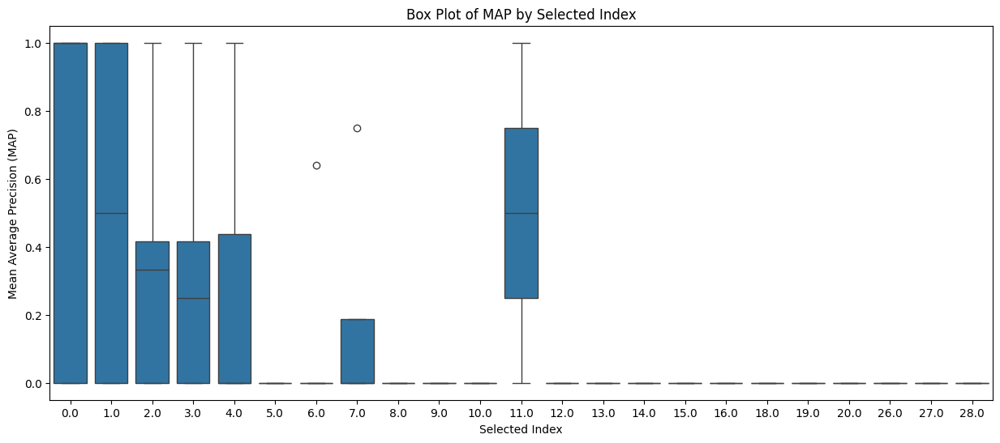

In [ ]:
plt.figure(figsize=(15, 6))
sns.boxplot(x='selected_place_index', y='metric_ap', data=data)
plt.title('Box Plot of MAP by Selected Index')
plt.xlabel('Selected Index')
plt.ylabel('Mean Average Precision (MAP)')
plt.show()

In [ ]:
data[data['selected_place_index'] == 11]

,search_input,timestamp,user_location,selected_place_index,selected_place_location,pin_location,metric_ap,metric_rr,search_type
192,ملاصدراکوچه ۵خلیلی,2023-05-20 18:49:15,"29.640585000000037,52.49589900000001",11.0,NaN,"29.62766300000001,52.51579699999999",1.0,1.0,Successful
1607,خیابان احمد آباد بیمارستان قائم,2023-05-20 13:43:10,"36.293461,59.67789100000002",11.0,NaN,"36.293293,59.58132899999998",0.0,0.0,Successful


In [ ]:
data[data['selected_place_index'] == 7]

,search_input,timestamp,user_location,selected_place_index,selected_place_location,pin_location,metric_ap,metric_rr,search_type
440,بن‌بست دشتی,2023-05-20 13:24:12,"35.70340655670391,51.44919991493226",7.0,NaN,"35.78371777502205,51.434681117534645",0.00,0.0,Successful
792,مینودر خیابان ۷ دی,2023-05-20 17:06:36,"36.2755771,49.996978299999995",7.0,NaN,"36.31224283340168,49.9938026458442",0.75,1.0,Successful
1209,مترو الزی,2023-05-20 17:26:14,"35.767223,51.45723699999999",7.0,NaN,"35.76075399999997,51.46566400000003",0.00,0.0,Successful
1929,میعاد جنوبی,2023-05-20 12:16:27,"35.7268634,50.6589232",7.0,"35.6575808,51.3524458",NaN,0.00,0.0,Select-Only


In [ ]:
data[data['selected_place_index'] == 4]

,search_input,timestamp,user_location,selected_place_index,selected_place_location,pin_location,metric_ap,metric_rr,search_type
340,اصفهان خیابان شمس ابادی,2023-05-20 16:16:46,"32.34603547896224,51.51047267178092",4.0,NaN,"32.649468899999995,51.713047500000016",0.000000,0.00,Successful
535,خیایبان والفج,2023-05-20 09:01:05,"35.837737789982704,50.942204735091885",4.0,"35.8179865,50.9685676",NaN,0.000000,0.00,Select-Only
775,حسابی,2023-05-20 08:23:53,"36.373871000000015,59.51317999999998",4.0,NaN,"36.361519,59.50968900000001",0.500000,0.50,Successful
845,نازی اباد خیابان تولایی,2023-05-20 08:10:06,"35.66141074302818,51.35756492614746",4.0,NaN,"35.636853567854374,51.39867514371873",0.250000,0.25,Successful
883,ولیعصر,2023-05-20 11:38:43,"38.0575144,46.2894529",4.0,NaN,"38.056618253231065,46.359979277561365",1.000000,1.00,Successful
1274,تقاطع هنرورو هدایت,2023-05-20 16:46:13,"36.31801999999999,59.599613000000005",4.0,"36.3354901,59.5990169",NaN,0.000000,0.00,Select-Only
1456,منظریه استخر طلاعیهم,2023-05-20 07:17:40,"38.03851300000002,46.20357899999996",4.0,NaN,"38.05097599999999,46.26745999999997",0.000000,0.00,Successful
1561,مرکز قلب شهی,2023-05-20 04:39:16,"35.70846600000001,51.420387000000005",4.0,NaN,"35.77428100000002,51.41045",0.000000,0.00,Successful
1586,وحید۱۳,2023-05-20 15:44:52,"36.29759599999999,59.65367499999999",4.0,NaN,"36.29854710000003,59.65401299999999",0.916667,1.00,Successful
1770,شاهین شهر میدان ولیعصر,2023-05-20 01:37:32,"32.63974400000001,51.720534999999984",4.0,NaN,"32.862008906791935,51.530192008079354",0.000000,0.00,Successful


Investigate any relation between the different definition of search and the user


*   search_input length (number of words)
*   time of search
*   content of search

Can you see any relation between content of search and the length of search query (search_input) ? You may use wordcloud to
show any possible differences in the content of search.

In [ ]:
import pandas as pd
import re

# Function to count characters including numbers without space separation
def count_words(text):
    # Split text into words using regex pattern for Persian words and numbers
    words = re.findall(r'[\u0600-\u06FF0-9]+', text)
    numbers = re.findall(r'\d+', text)
    return len(words) + len(numbers)
# Add a new column for text length
data['search_input_length'] = data['search_input'].apply(count_words)

data


<ipython-input-16-801973af0ea9>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['search_input_length'] = data['search_input'].apply(count_words)


,search_input,timestamp,user_location,selected_place_index,selected_place_location,pin_location,metric_ap,metric_rr,search_type,search_input_length
0,بلوارایت اله ایزدی,2023-05-20 03:50:50,"32.4251125,51.3261579",0.0,"32.6306106,51.4016186",NaN,0.000000,0.000000,Select-Only,3
1,کلینیک چشم پزشکی نگاه,2023-05-20 09:39:07,NaN,NaN,NaN,NaN,NaN,NaN,Failed,4
2,سازمان راهداری و حمل و نقل جاده ای,2023-05-20 05:42:01,"35.746677000000005,51.42000200000001",0.0,NaN,"35.709445999999964,51.405190000000005",1.000000,1.000000,Successful,8
3,تهران مترو خيام,2023-05-20 12:01:37,"35.82748676814743,50.97467422485352",2.0,NaN,"35.67380742811089,51.41375720500947",0.416667,0.333333,Successful,3
4,کرج میدان,2023-05-20 18:02:16,"35.8113711,51.0059891",0.0,"35.8122984,51.0074763",NaN,0.000000,0.000000,Select-Only,2
...,...,...,...,...,...,...,...,...,...,...
1995,دانشکده شهید,2023-05-20 04:51:17,"35.648270000000025,51.41741999999996",0.0,NaN,"35.702960999999995,51.40856600000001",1.000000,1.000000,Successful,2
1996,رسالت,2023-05-20 05:45:24,"31.344528,48.717236000000014",0.0,"31.2959223,48.7455315",NaN,0.000000,0.000000,Select-Only,1
1997,رحمت اباد,2023-05-20 04:03:33,"29.683810999999967,52.455036000000035",0.0,"29.6243922,52.5133824",NaN,0.000000,0.000000,Select-Only,2
1998,مرزداران،برج‌ الوند,2023-05-20 12:25:29,"35.7176449,51.3454669",0.0,NaN,"35.73380590000001,51.34507980000001",0.805556,1.000000,Successful,2


In [ ]:
data[data['selected_place_index'] == 4]

,search_input,timestamp,user_location,selected_place_index,selected_place_location,pin_location,metric_ap,metric_rr,search_type,search_input_length
340,اصفهان خیابان شمس ابادی,2023-05-20 16:16:46,"32.34603547896224,51.51047267178092",4.0,NaN,"32.649468899999995,51.713047500000016",0.000000,0.00,Successful,4
535,خیایبان والفج,2023-05-20 09:01:05,"35.837737789982704,50.942204735091885",4.0,"35.8179865,50.9685676",NaN,0.000000,0.00,Select-Only,2
775,حسابی,2023-05-20 08:23:53,"36.373871000000015,59.51317999999998",4.0,NaN,"36.361519,59.50968900000001",0.500000,0.50,Successful,1
845,نازی اباد خیابان تولایی,2023-05-20 08:10:06,"35.66141074302818,51.35756492614746",4.0,NaN,"35.636853567854374,51.39867514371873",0.250000,0.25,Successful,4
883,ولیعصر,2023-05-20 11:38:43,"38.0575144,46.2894529",4.0,NaN,"38.056618253231065,46.359979277561365",1.000000,1.00,Successful,1
1274,تقاطع هنرورو هدایت,2023-05-20 16:46:13,"36.31801999999999,59.599613000000005",4.0,"36.3354901,59.5990169",NaN,0.000000,0.00,Select-Only,3
1456,منظریه استخر طلاعیهم,2023-05-20 07:17:40,"38.03851300000002,46.20357899999996",4.0,NaN,"38.05097599999999,46.26745999999997",0.000000,0.00,Successful,3
1561,مرکز قلب شهی,2023-05-20 04:39:16,"35.70846600000001,51.420387000000005",4.0,NaN,"35.77428100000002,51.41045",0.000000,0.00,Successful,3
1586,وحید۱۳,2023-05-20 15:44:52,"36.29759599999999,59.65367499999999",4.0,NaN,"36.29854710000003,59.65401299999999",0.916667,1.00,Successful,2
1770,شاهین شهر میدان ولیعصر,2023-05-20 01:37:32,"32.63974400000001,51.720534999999984",4.0,NaN,"32.862008906791935,51.530192008079354",0.000000,0.00,Successful,4


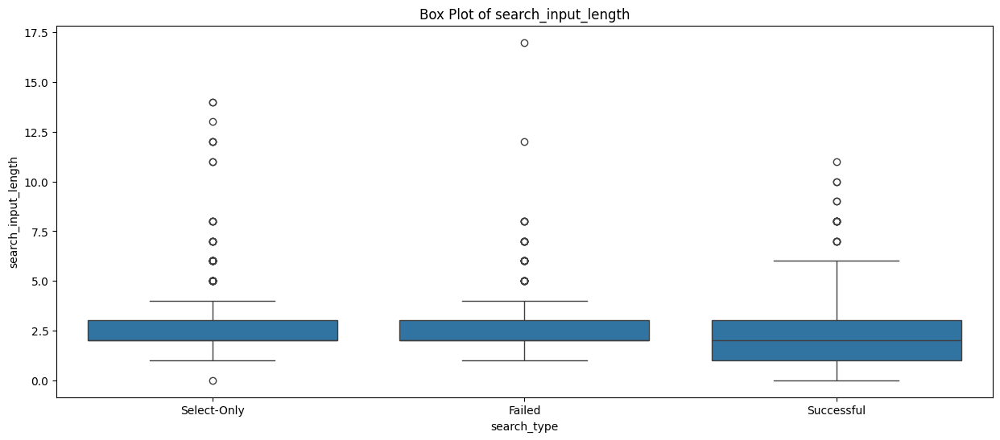

In [ ]:
plt.figure(figsize=(15, 6))
sns.boxplot(x='search_type', y='search_input_length', data=data)
plt.title('Box Plot of search_input_length')
plt.xlabel('search_type')
plt.ylabel('search_input_length')
plt.show()

In [ ]:
data[data['search_type'] == 'Successful']['search_input_length'].describe()

count    1214.000000
mean        2.242998
std         1.299792
min         0.000000
25%         1.000000
50%         2.000000
75%         3.000000
max        11.000000
Name: search_input_length, dtype: float64

In [ ]:
data[data['search_type'] == 'Failed']['search_input_length'].describe()

count    328.000000
mean       2.597561
std        1.728408
min        1.000000
25%        2.000000
50%        2.000000
75%        3.000000
max       17.000000
Name: search_input_length, dtype: float64

In [ ]:
data[data['search_type'] == 'Select-Only']['search_input_length'].describe()

count    458.000000
mean       2.746725
std        1.947124
min        0.000000
25%        2.000000
50%        2.000000
75%        3.000000
max       14.000000
Name: search_input_length, dtype: float64